In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib
import anndata
import matplotlib.pyplot as plt

from matplotlib.pyplot import rc_context
import matplotlib.colors as mcolors

plt.rcParams['figure.dpi']=200
 

In [2]:
xe_adata = sc.read_h5ad("../Xenium_all.h5ad")
xe_adata = xe_adata[xe_adata.obs.ident.isin(['ShamR','Hour4R','Hour12R', 'Day2R', 'Day14R', 'Week6R'])]
adata_vis = sc.read_h5ad("Visium_IRI_R.h5ad")

sham_xe = xe_adata[xe_adata.obs.ident == "ShamR"]
sham_vis = adata_vis[adata_vis.obs.ident == "ShamR"]

In [3]:
corr_df = pd.read_csv("/home/spatial/Visium/notebooks/Xe2vis_map_df_diameter_55um.csv", index_col=0)

In [ ]:
### aggregate gene expression
count_df = sc.get.obs_df(xe_adata, keys=gene_overlap, use_raw=True)
agg_gene = []

df_visium =  adata_vis.obs[["x_align","y_align"]]
df_visium["spot_id"] = df_visium.index.tolist()

for spot_id in df_visium['spot_id']:
    cells_in_spot = corr_df[corr_df['spot_id'] == spot_id]['cell_id']
    counts = count_df.loc[cells_in_spot.tolist(),]
    sum_counts = counts.sum(axis=0).to_numpy()
    agg_gene.append(sum_counts)
    

In [6]:
agg_gene_df = pd.DataFrame(agg_gene)
agg_gene_df.columns = gene_overlap
agg_gene_df.index = df_visium['spot_id']
agg_gene_df.fillna(0, inplace=True) 

In [16]:
shared_spots = agg_gene_df.index.intersection(sham_vis.obs.index)
agg_gene_df_sham = agg_gene_df.loc[shared_spots,]

In [25]:
gene_overlap = [g for g in xe_adata.var_names.tolist() if g in adata_vis.var_names.tolist()]

Xenium_agg_gene_df = agg_gene_df_sham.loc[:,gene_overlap]
Visium_gene_df = sc.get.obs_df(adata_vis, keys = gene_overlap, use_raw=True)
corr = pd.DataFrame(Xenium_agg_gene_df.corrwith(Visium_gene_df, method = "pearson",), columns = ["pearson_r"])
corr[corr["pearson_r"]<=0] = 0
corr = corr.fillna(0)
corr.sort_values(by = "pearson_r", ascending=False).head(40) 

,pearson_r
Acsm3,0.856231
Cyp7b1,0.829400
Slc12a1,0.789112
Bcat1,0.788783
Slc7a13,0.769708
Aqp1,0.767921
Slc14a2,0.748023
Ptger3,0.746897
Fgf1,0.746502
Epcam,0.745752


/tmp/ipykernel_1086018/2973159896.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


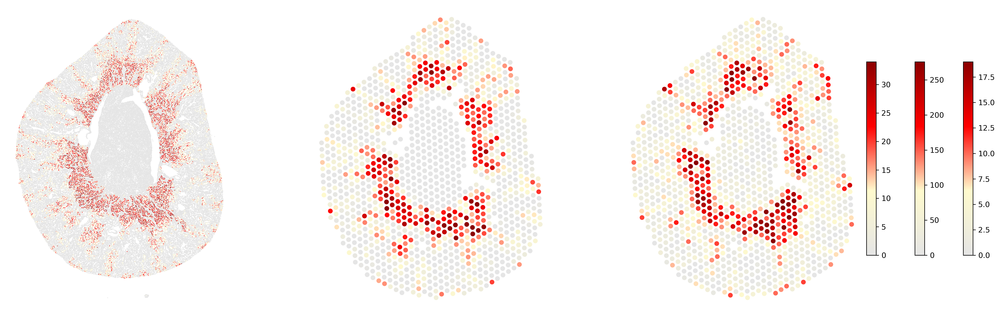

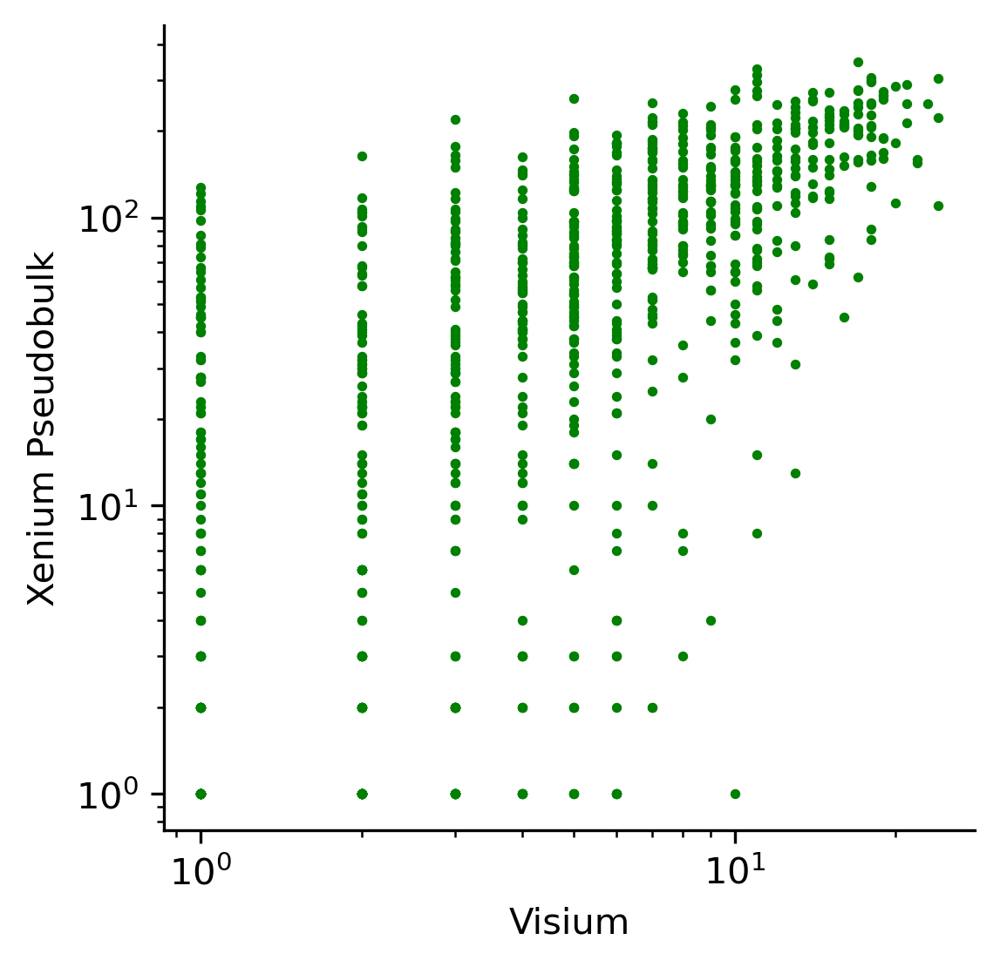

In [40]:
gene = "Slc7a13"
plot_compare(xenium_adata = sham_xe, xenium_df = agg_gene_df_sham, visium_adata = sham_vis, gene = gene, 
             cmap=cmap, save = f"Xenium_Pseudobulk_visium_{gene}.png")
plot_coor(sham_xe, sham_vis, gene)

/tmp/ipykernel_1086018/2973159896.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


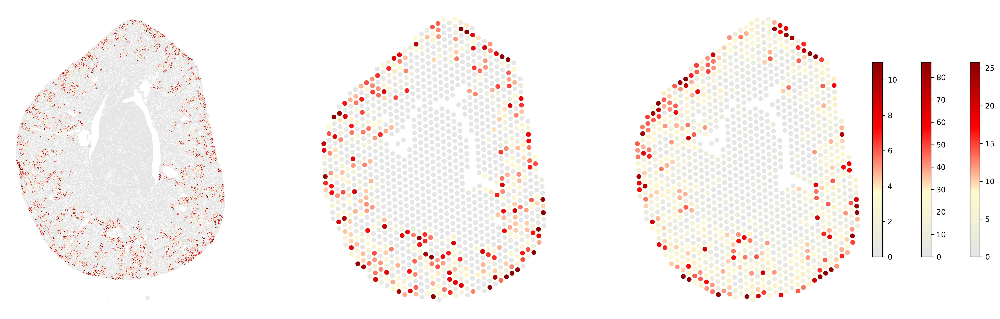

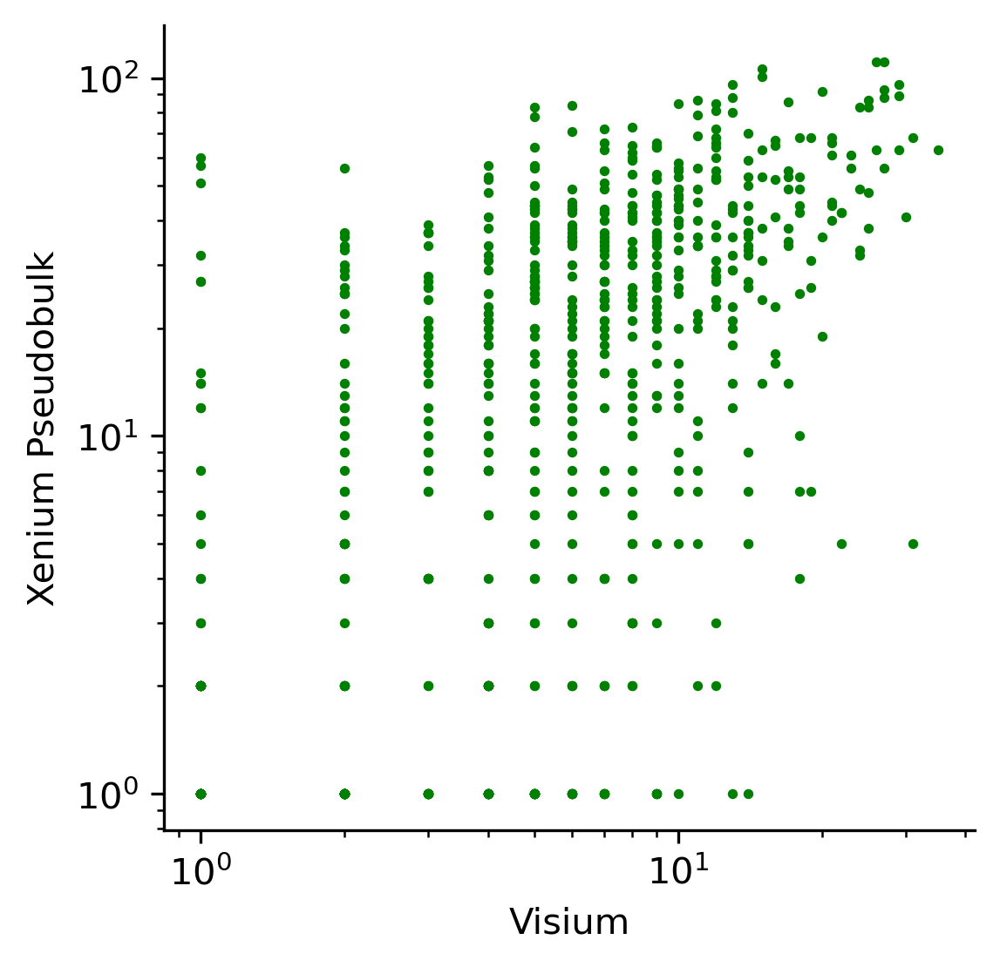

In [41]:
gene = "Slc5a2"
plot_compare(xenium_adata = sham_xe, xenium_df = agg_gene_df_sham, visium_adata = sham_vis, gene = gene, 
             cmap=cmap, save = f"Xenium_Pseudobulk_visium_{gene}.png")
plot_coor(sham_xe, sham_vis, gene)

/tmp/ipykernel_1086018/2973159896.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


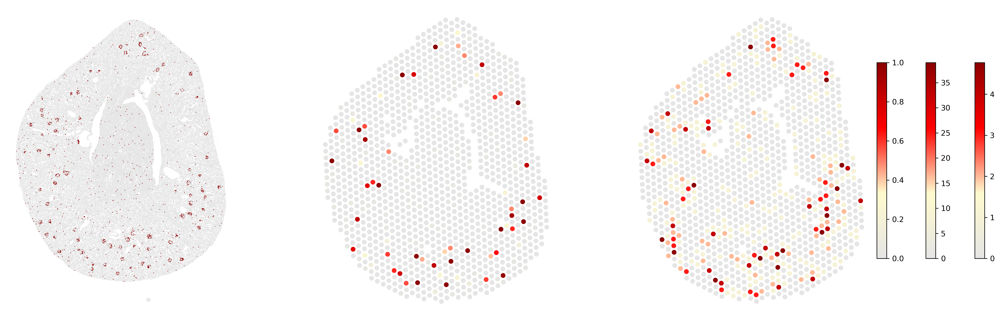

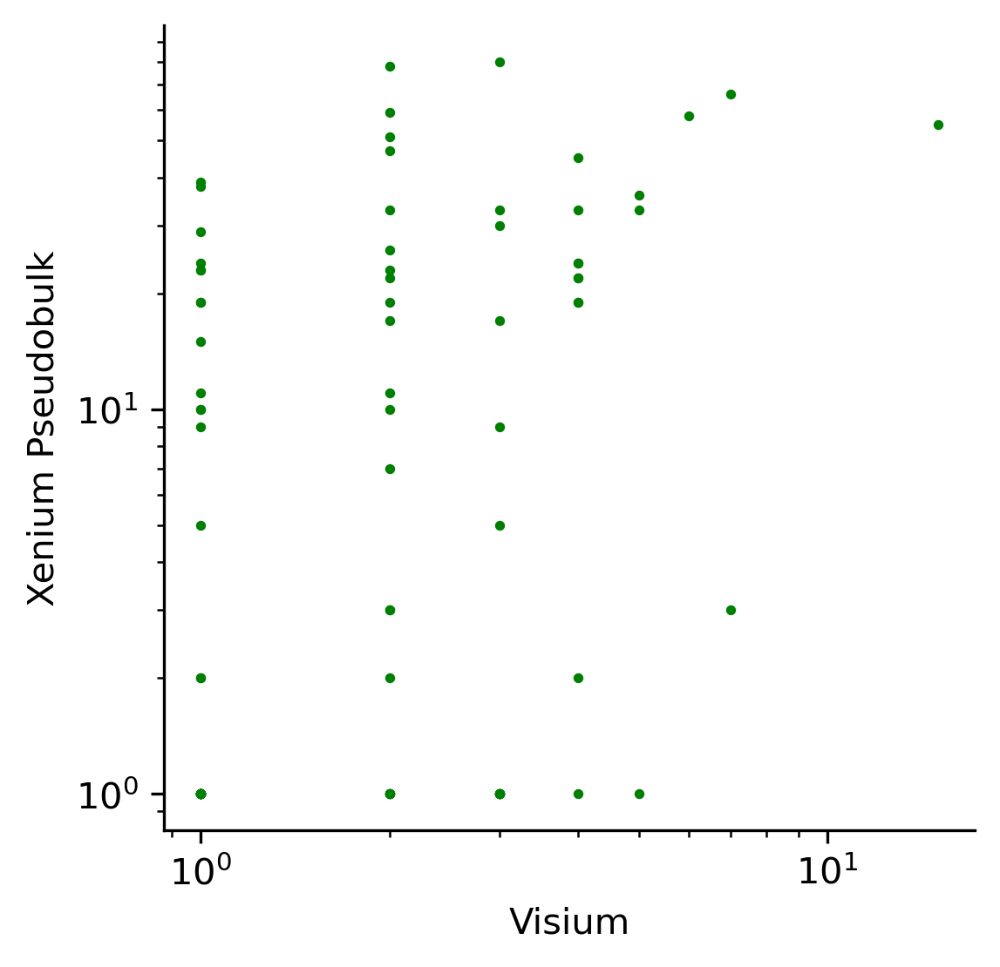

In [42]:
gene = "Nphs2"
plot_compare(xenium_adata = sham_xe, xenium_df = agg_gene_df_sham, visium_adata = sham_vis, gene = gene, 
             cmap=cmap, save = f"Xenium_Pseudobulk_visium_{gene}.png")
plot_coor(sham_xe, sham_vis, gene)

In [45]:
gene_list = ["Nphs2","Slc5a2","Slc7a13","Slc12a1"]
for g in gene_list:
    r = plot_coor(sham_xe, sham_vis, g)
    print(g, r)

Nphs2 0.3940056162542234
Slc5a2 0.6742744797299178
Slc7a13 0.7697079133312147
Slc12a1 0.7891122615152039


In [26]:
def plot_coor(adata_xe, adata_vis, gene):
    xe_count_df = sc.get.obs_df(adata_xe, keys=gene, use_raw=True)
    vis_count_df = sc.get.obs_df(adata_vis, keys=gene, use_raw=True)

    agg_gene_df_gene = []

    for spot_id in sham_vis.obs.index:
        cells_in_spot = corr_df[corr_df['spot_id'] == spot_id]['cell_id']
        xe_counts = xe_count_df.loc[cells_in_spot.tolist(),]
        vis_counts = vis_count_df.loc[spot_id,]
        agg_gene_df_gene.append([xe_counts.sum(),vis_counts])

    df = pd.DataFrame(agg_gene_df_gene)
    r = df.loc[:,0].corr(df.loc[:,1])
    return r
    fig, ax = plt.subplots(figsize = (3,3), dpi = 300)

    ax.scatter(np.array(pd.DataFrame(agg_gene_df_gene))[:,1], 
                np.array(pd.DataFrame(agg_gene_df_gene))[:,0], s = 3, color = "green")
    ax.set_xlabel("Visium")
    ax.set_ylabel("Pseudo-Visium")
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.spines[['right', 'top']].set_visible(False)
    #ax.text(1, 200, f'{gene} (r = {r:.2f})', fontsize=12)
    plt.savefig(f"Extended_Fig1_data/ShamR_{gene}_corr.png", dpi=300, transparent=True, bbox_inches="tight", pad_inches=0)
    plt.show()

In [8]:
def plot_compare(xenium_adata, xenium_df, visium_adata, gene, cmap, save = None):

    counts_xe = sc.get.obs_df(xenium_adata, keys = gene, use_raw=True).to_numpy().flatten()
    norm_xe = matplotlib.colors.Normalize(vmin=min(counts_xe), vmax=np.quantile(counts_xe, 0.99))
    mapper_xe = matplotlib.cm.ScalarMappable(norm=norm_xe, cmap=cmap)
    all_colors_xe = [to_hex(mapper_xe.to_rgba(c)) for c in counts_xe]
    
    counts = xenium_df[gene].to_numpy()
    norm = matplotlib.colors.Normalize(vmin=min(counts), vmax=np.quantile(counts, 0.99))
    mapper = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
    all_colors = [to_hex(mapper.to_rgba(c)) for c in counts]
    
    ### spot expression of True Visium
    tmp_vis_ad = visium_adata[visium_adata.obs.ident == "ShamR"]
    counts_vis = sc.get.obs_df(tmp_vis_ad, keys = gene, use_raw=True).to_numpy().flatten()
    norm_vis = matplotlib.colors.Normalize(vmin=min(counts_vis), vmax=np.quantile(counts_vis, 0.99))
    mapper_vis = matplotlib.cm.ScalarMappable(norm=norm_vis, cmap=cmap)
    all_colors_vis = [to_hex(mapper_vis.to_rgba(c)) for c in counts_vis]
    
    x = tmp_vis_ad.obs["x_align"]
    y = tmp_vis_ad.obs["y_align"]
    
    fig, axs = plt.subplots(1, 3, dpi=300, figsize=(18, 6))  # Adjusted for 3 subplots with a wider total figure size

    # Xenium plot
    axs[0].scatter(np.array(xenium_adata.obs.x_centroid), np.array(xenium_adata.obs.y_centroid), marker='o', linewidth=0, alpha=1, color=all_colors_xe, s=1)
    axs[0].axis('scaled')
    axs[0].axis("off")
    axs[0].invert_yaxis()
    
    # Xenium Pseudobulk
    axs[1].scatter(x, y, marker='o', linewidth=0, alpha=1, color=all_colors, s=40)
    axs[1].axis('scaled')
    axs[1].axis("off")
    axs[1].invert_yaxis()
    
    # Visium plot 
    axs[2].scatter(x, y, marker='o', linewidth=0, alpha=1, color=all_colors_vis, s=40)
    axs[2].axis('scaled')
    axs[2].axis("off")
    axs[2].invert_yaxis()
    
    # Colorbar for the first plot (Xenium)
    cbar_ax1 = fig.add_axes([0.95, 0.2, 0.01, 0.6])  # Position adjusted for consistent distance
    fig.colorbar(mapper_xe, ax=axs[2], orientation='vertical', fraction=0.02, pad=0.02, cax=cbar_ax1)
    
    # Colorbar for the second plot (Xenium Pseudobulk)
    cbar_ax2 = fig.add_axes([1.0, 0.2, 0.01, 0.6])  # Position adjusted for consistent distance
    fig.colorbar(mapper, ax=axs[2], orientation='vertical', fraction=0.02, pad=0.02, cax=cbar_ax2)
    
    # Colorbar for the third plot (Visium)
    cbar_ax3 = fig.add_axes([1.05, 0.2, 0.01, 0.6])  # Position adjusted for the third subplot
    fig.colorbar(mapper_vis, ax=axs[2], orientation='vertical', fraction=0.02, pad=0.02, cax=cbar_ax3)

    
    if save:
        plt.tight_layout()
        fig.savefig(save, dpi=500, transparent=True,  bbox_inches="tight", pad_inches=0)
        
    plt.show()